In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

KeyboardInterrupt: 

## 🧠 Code Explanation: Alzheimer's Dataset Transformations & Saving

---

### 1. **Imports and Setup**
- `os`, `random`, `Image`, `matplotlib`, `torchvision.transforms` → for data loading and augmentation.
- `save_image` → saves tensors as image files.

---

### 2. **Path and Class Definitions**
- `base_path`: Root directory where the 4 class folders are stored.
- `classes`: List of the 4 dementia stages.

---

### 3. **Defined Transformations (with Normalization)**
Each transformation:
- Converts image to **grayscale**
- Resizes to **256×256**
- Converts to a **Tensor**
- **Normalizes** to `[-1, 1]` using `mean=0.5, std=0.5`

Transformations used:
- `original_consistent`
- `flipped_consistent`
- `rotated_consistent` (10°)
- `affine_consistent` (with translation)
- `blurred_consistent` (Gaussian blur)

---

### 4. **Create In-Memory Dataset Dictionary**
Stores:
- `images` (as tensors)
- `labels` (as integers)
- `transform_names`
- `class_names`
- `original_filenames`

---

### 5. **Image Loading & Transformation Loop**
- For each class, first 5 images are picked (`sorted(os.listdir(...))[:5]`)
- Each image is loaded and all 5 transformations are applied.
- Results are appended to the in-memory dataset.

---

### 6. **Visualize All 100 Images**
Function `visualize_transformations()`:
- De-normalizes tensors back to `[0, 1]`
- Displays them in a 20×5 grid (20 rows = 4 classes × 5 images; 5 columns = 5 transformations)
- Each image’s title shows the transformation name
- Y-axis shows class and filename

---

### 7. **Save Transformed Images to Disk**
- Saves in: `/kaggle/working/TransformedOASIS/`
- Structure: 


✅ Total images prepared in memory: 100


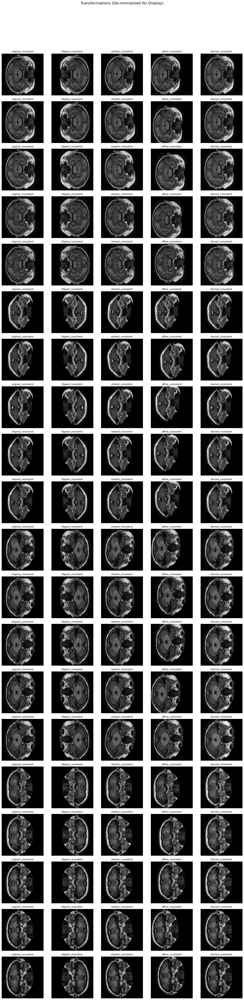

✅ All transformed images saved to: /kaggle/working/TransformedOASIS
Verify directory structure: ['Non Demented', 'Very mild Dementia', 'Moderate Dementia', 'Mild Dementia']
  Non Demented: 25 images
  Very mild Dementia: 25 images
  Moderate Dementia: 25 images
  Mild Dementia: 25 images


In [2]:
import os
import random
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torchvision.utils import save_image # Import this if not already

# Define paths and classes
base_path = '/kaggle/input/imagesoasis/Data'
classes = ['Non Demented', 'Very mild Dementia', 'Mild Dementia', 'Moderate Dementia']

# Define transformations
# These transformations produce TENSORS that are Grayscale, 256x256, and Normalized [-1, 1]
# We need to DE-NORMALIZE before saving as an image file.
transformations = {
    'original_consistent': T.Compose([
        T.Grayscale(num_output_channels=1),
        T.Resize((256, 256)),
        T.ToTensor(),
        T.Normalize(mean=[0.5], std=[0.5])
    ]),
    'flipped_consistent': T.Compose([
        T.Grayscale(num_output_channels=1),
        T.Resize((256, 256)),
        T.RandomHorizontalFlip(p=1.0),
        T.ToTensor(),
        T.Normalize(mean=[0.5], std=[0.5])
    ]),
    'rotated_consistent': T.Compose([
        T.Grayscale(num_output_channels=1),
        T.Resize((256, 256)),
        T.RandomRotation(10), # Changed to 10 degrees to match your training augmentation
        T.ToTensor(),
        T.Normalize(mean=[0.5], std=[0.5])
    ]),
    'affine_consistent': T.Compose([
        T.Grayscale(num_output_channels=1),
        T.Resize((256, 256)),
        T.RandomAffine(degrees=0, translate=(0.1, 0.1)),
        T.ToTensor(),
        T.Normalize(mean=[0.5], std=[0.5])
    ]),
    'blurred_consistent': T.Compose([
        T.Grayscale(num_output_channels=1),
        T.Resize((256, 256)),
        T.GaussianBlur(kernel_size=5),
        T.ToTensor(),
        T.Normalize(mean=[0.5], std=[0.5])
    ])
}

# Create output dataset (this part is primarily for collecting in memory for visualization)
transformed_dataset_in_memory = { # Renamed to avoid confusion with saved dataset
    'images': [],
    'labels': [],
    'transform_names': [],
    'class_names': [],
    'original_filenames': []
}

# Load and transform images, storing tensors in memory
for label, cls in enumerate(classes):
    class_path = os.path.join(base_path, cls)
    image_files = sorted(os.listdir(class_path))[:5]

    for img_file in image_files:
        img_path = os.path.join(class_path, img_file)
        img = Image.open(img_path).convert("RGB") # Open as RGB, Grayscale transform will handle it

        for t_name, t_fn in transformations.items():
            transformed_img_tensor = t_fn(img) # This tensor is in [-1, 1] range
            transformed_dataset_in_memory['images'].append(transformed_img_tensor)
            transformed_dataset_in_memory['labels'].append(label)
            transformed_dataset_in_memory['transform_names'].append(t_name)
            transformed_dataset_in_memory['class_names'].append(cls)
            transformed_dataset_in_memory['original_filenames'].append(img_file)

print(f"✅ Total images prepared in memory: {len(transformed_dataset_in_memory['images'])}")

# ----------------------------
# VISUALIZATION OF ALL 100 IMAGES (Optional, but useful for verification)
# ----------------------------
# This visualization code is mostly for debugging the transformations.
# The previous version was already good. I'll just include the de-normalization logic here for completeness.

def visualize_transformations(transformed_data, num_samples_per_original=5, cols_per_original=5):
    # Calculate total number of images to display
    num_original_images = len(transformed_data['class_names']) // len(transformations)
    total_images_to_display = num_original_images * len(transformations)

    rows = num_original_images
    cols = cols_per_original

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3)) # Adjusted figure size

    for i in range(total_images_to_display):
        img_tensor = transformed_data['images'][i]
        
        # De-normalize for display: convert from [-1, 1] to [0, 1]
        img_display = (img_tensor * 0.5) + 0.5 
        img_np = img_display.squeeze(0).numpy() # Squeeze channel dim for grayscale imshow

        row_idx = i // cols
        col_idx = i % cols
        ax = axes[row_idx, col_idx] if rows > 1 else axes[col_idx] # Handle single row case

        ax.imshow(img_np, cmap='gray')
        ax.axis('off')

        current_transform_name = transformed_data['transform_names'][i]
        original_filename = transformed_data['original_filenames'][i]
        class_name = transformed_data['class_names'][i]

        ax.set_title(current_transform_name, fontsize=10)
        if col_idx == 0:
            ax.set_ylabel(f"{class_name}\n{original_filename}", fontsize=8)

    plt.suptitle("Transformations (De-normalized for Display)", fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

# Call the visualization function with the in-memory dataset
visualize_transformations(transformed_dataset_in_memory)


# ----------------------------
# IMPORTANT FIX: SAVE THE IMAGES CORRECTLY TO DISK
# ----------------------------

# Define the output root directory
output_root = '/kaggle/working/TransformedOASIS'
os.makedirs(output_root, exist_ok=True) # Ensure the base directory exists

# Create folder structure and save images
for i in range(len(transformed_dataset_in_memory['images'])):
    img_tensor = transformed_dataset_in_memory['images'][i]
    cls = transformed_dataset_in_memory['class_names'][i]
    transform_name = transformed_dataset_in_memory['transform_names'][i] # Renamed variable for clarity
    filename = transformed_dataset_in_memory['original_filenames'][i]
    
    # Create class folder (e.g., /kaggle/working/TransformedOASIS/Non Demented)
    class_save_dir = os.path.join(output_root, cls)
    os.makedirs(class_save_dir, exist_ok=True)

    # Define new filename with original name + transform name
    base_filename = os.path.splitext(filename)[0]
    new_filename = f"{base_filename}_{transform_name}.png" # Save as PNG to avoid JPEG compression artifacts

    save_path = os.path.join(class_save_dir, new_filename)

    # CRITICAL: De-normalize the tensor before saving
    # save_image expects tensor values in [0, 1] for floats.
    # Your img_tensor is in [-1, 1].
    img_to_save = (img_tensor * 0.5) + 0.5 # Convert from [-1, 1] to [0, 1]

    save_image(img_to_save, save_path) # Save the de-normalized image

print(f"✅ All transformed images saved to: {output_root}")
print(f"Verify directory structure: {os.listdir(output_root)}") # Check created class folders
for cls_folder in os.listdir(output_root):
    if os.path.isdir(os.path.join(output_root, cls_folder)):
        print(f"  {cls_folder}: {len(os.listdir(os.path.join(output_root, cls_folder)))} images")

In [3]:
import shutil

# Define the folder to zip and output zip file name
folder_to_zip = '/kaggle/working/TransformedOASIS'
zip_path = '/kaggle/working/TransformedOASIS.zip'

# Create the zip file
shutil.make_archive(base_name=zip_path.replace('.zip', ''), format='zip', root_dir=folder_to_zip)

print(f"✅ Zipped folder created at: {zip_path}")


✅ Zipped folder created at: /kaggle/working/TransformedOASIS.zip


## 🧠 CNN Model Evaluation on Transformed Alzheimer's Dataset

---

### 1. **Import Required Libraries**
- `torch`, `torch.nn`, `torchvision`, `matplotlib`, `numpy` — used for model loading, data handling, and visualization.

---

### 2. **Define Model: SimpleCNN**
- A **convolutional neural network** designed for 1-channel (grayscale) input, suitable for medical imaging.
- Structure:
  - 3 Convolutional blocks (Conv → ReLU → MaxPool)
  - Adaptive Average Pooling to fixed (7×7) output
  - Fully connected classifier:
    - `Flatten → Linear(6272→512) → Dropout → Linear(512→4)`
- Output: Logits for 4 classes (Non Demented, Very Mild, Mild, Moderate)

---

### 3. **Load the Trained Model**
- Function `load_model()`:
  - Loads `.pth` weights from `model_path`
  - Moves model to **GPU if available**
  - Uses `DataParallel` if multiple GPUs
  - Sets model to `.eval()` mode for inference
- Handles both single and multi-GPU saved checkpoints.

---

### 4. **Dataset Preparation**
- Uses `ImageFolder` to load saved images from:
/kaggle/working/TransformedOASIS/
Non Demented/
Very mild Dementia/
Mild Dementia/
Moderate Dementia/


- Applies transformations matching the training pipeline:
- Convert to grayscale (1 channel)
- Resize to 256×256
- Normalize pixel values to `[-1, 1]` via `mean=0.5, std=0.5`
- Creates a PyTorch `DataLoader` with `batch_size=16` for prediction.

---

### 5. **Prediction Loop**
- Performs model inference with `torch.no_grad()` for speed and memory efficiency.
- Moves data to GPU (if available).
- Computes:
- Total number of correct predictions
- Accuracy = `(correct / total) * 100`
- Stores:
- Predictions (`all_preds`)
- Ground truth labels (`all_labels`)
- Input images (`all_imgs`)

---

### 6. **Prediction Visualization**
- Function `show_predictions()`:
- Displays predictions with actual and predicted class names.
- De-normalizes each image from `[-1, 1] → [0, 1]` for correct visualization.
- Marks correct predictions in **green**, incorrect ones in **red**.
- Shows up to `num_samples_to_show=100` (adjustable).
- Uses a grid layout: 5 images per row (default).

---

### ✅ Result:
- You get:
- A detailed evaluation report (accuracy %)
- A visual display of predictions with color-coded correctness
- Useful for identifying **which classes are being misclassified** and **how consistent the model is** on transformed inputs.


Using 2 GPUs with DataParallel!
✅ Accuracy on transformed dataset: 65.00%


/tmp/ipykernel_35/548040371.py:138: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


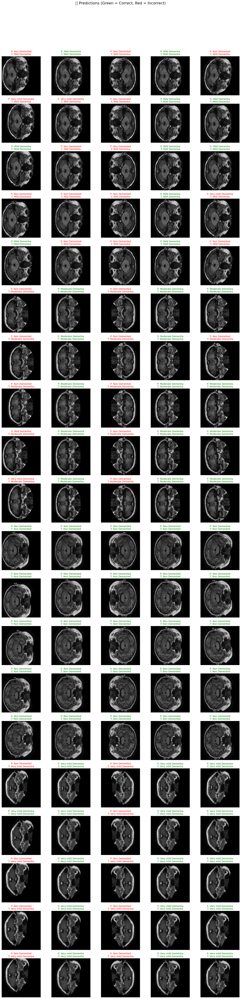

In [4]:
import os
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

# ----------------------
# 1. Define Model Class
# ----------------------
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=4):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.adaptive_pool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.adaptive_pool(x)
        x = self.classifier(x)
        return x

# ----------------------------
# 2. Load Trained Model
# ----------------------------
def load_model(model_path, num_classes=4):
    model = SimpleCNN(num_classes)
    if torch.cuda.is_available():
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs with DataParallel!")
            model = nn.DataParallel(model)
        model = model.to('cuda')
    checkpoint = torch.load(model_path, map_location='cuda' if torch.cuda.is_available() else 'cpu')
    # If the checkpoint was saved from a DataParallel model, you might need to adjust:
    # If 'module.' prefix exists:
    # new_state_dict = {k.replace('module.', ''): v for k, v in checkpoint.items()}
    # model.load_state_dict(new_state_dict)
    # else:
    model.load_state_dict(checkpoint) # This line is correct if saved without 'module.' prefix
    model.eval()
    return model

model_path = '/kaggle/input/alzhiemers_cnn/pytorch/default/1/alzheimers_model_corrected (1).pth'
model = load_model(model_path)

# ----------------------------
# 3. Prepare Dataset Loader
# ----------------------------
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256, 256)), # Corrected size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]) # Added normalization
])

data_path = '/kaggle/working/TransformedOASIS'
dataset = datasets.ImageFolder(root=data_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=False)

class_names = dataset.classes

# ----------------------------
# 4. Run Predictions
# ----------------------------
correct = 0
total = 0
all_preds = []
all_labels = []
all_imgs = []

with torch.no_grad():
    for images, labels in dataloader:
        if torch.cuda.is_available():
            images = images.cuda()
            labels = labels.cuda()

        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        
        correct += (preds == labels).sum().item()
        total += labels.size(0)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_imgs.extend(images.cpu())

accuracy = 100 * correct / total
print(f"✅ Accuracy on transformed dataset: {accuracy:.2f}%")

# ----------------------------
# 5. Visualize Predictions
# ----------------------------
def show_predictions(images, labels, preds, class_names, num_samples_to_show=20, cols=5):
    # Ensure num_samples_to_show does not exceed available images
    num_samples_to_show = min(num_samples_to_show, len(images))

    rows = (num_samples_to_show + cols - 1) // cols
    plt.figure(figsize=(cols * 3, rows * 3))

    for i in range(num_samples_to_show):
        img_tensor = images[i]
        
        # CORRECTED: De-normalize image for proper visualization
        # This converts pixel values from [-1, 1] back to [0, 1] for display
        img_display = (img_tensor * 0.5) + 0.5 
        img_np = img_display.squeeze().numpy() # Squeeze channel dimension (1) for grayscale display

        label = class_names[labels[i]]
        pred = class_names[preds[i]]
        correct = label == pred

        plt.subplot(rows, cols, i + 1)
        # Use vmin=0, vmax=1 to explicitly tell imshow the data range,
        # although with proper de-normalization, it's often not strictly necessary but good practice.
        plt.imshow(img_np, cmap='gray', vmin=0, vmax=1) 
        plt.title(f"P: {pred}\nT: {label}", color='green' if correct else 'red', fontsize=10)
        plt.axis('off')
        
    plt.suptitle("✅ Predictions (Green = Correct, Red = Incorrect)", fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

# You might want to adjust how many samples to show, e.g., 20
show_predictions(all_imgs, all_labels, all_preds, class_names, num_samples_to_show=100)

# 🔬 Grad-CAM Visualizations on Transformed Alzheimer's MRI Dataset

---

### 🧠 1. Model Definition: `SimpleCNN`
- A convolutional neural network trained for 4-class classification:
  - Non Demented
  - Very Mild Dementia
  - Mild Dementia
  - Moderate Dementia
- Key Layers:
  - 3 Convolutional blocks (`Conv2d → ReLU → MaxPool`)
  - Adaptive Average Pooling → 7×7 output
  - Fully Connected Classifier (`6272 → 512 → Dropout → 4`)

---

### 📦 2. Load the Trained Model
- Loads `.pth` checkpoint (supports both CPU/GPU and DataParallel).
- Model is moved to GPU if available.
- Automatically switches to evaluation mode (`model.eval()`).

---

### 🖼️ 3. Dataset Loader
- Loads the **transformed OASIS dataset** from:
/kaggle/working/TransformedOASIS/

yaml
Copy
Edit
- Uses the same preprocessing pipeline:
- Grayscale (1 channel)
- Resize to 256×256
- Normalize to `[-1, 1]`
- Wraps in a `DataLoader` for iteration (batch size = 1 for Grad-CAM)

---

### 🔥 4. Grad-CAM Class: `GradCAM`
- Hook-based class that extracts **intermediate activations and gradients**.
- Targets the final convolutional layer (`features.6`) in `SimpleCNN`.
- Grad-CAM is computed as:
- Gradient-weighted sum of activation maps
- ReLU on result → Upsampled to input image size
- Normalized to [0, 1] for heatmap overlay
- **Key Fix**: Model is handled correctly even if wrapped in `nn.DataParallel`.

---

### ✅ 5. Run Predictions + Generate Heatmaps
- Loop through each image:
- Enable gradients on input
- Forward pass to get predictions
- Backward pass using one-hot encoding of the predicted class
- Extract Grad-CAM heatmap for that prediction
- Track:
- Predictions (`all_preds`)
- Ground Truth (`all_labels`)
- De-normalized images (`all_imgs_for_display`)
- Heatmaps (`all_heatmaps`)
- Compute overall accuracy on the dataset.

---

### 🖼️ 6. Visualization: `show_predictions_with_gradcam()`
- For each sample, display two side-by-side images:
1. Original MRI with prediction & true label
2. Heatmap (Grad-CAM) overlaid on the MRI
- Titles are color-coded:
- ✅ Green = Correct prediction
- ❌ Red = Incorrect prediction
- `num_samples_to_show` is customizable (default: 10)

---

### 🎯 Final Output:
- Accuracy is printed.
- You visually inspect **which areas the model focused on**.
- Helps understand **model decisions** and whether it’s making **medically plausible choices**.

---

### 🛠️ Notes:
- You can extend this by saving the Grad-CAM heatmaps for external analysis.
- Useful for debugging **why certain samples were misclassified**.

Using 2 GPUs with DataParallel!


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


✅ Accuracy on transformed dataset: 65.00%


/tmp/ipykernel_35/1037569184.py:235: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98])


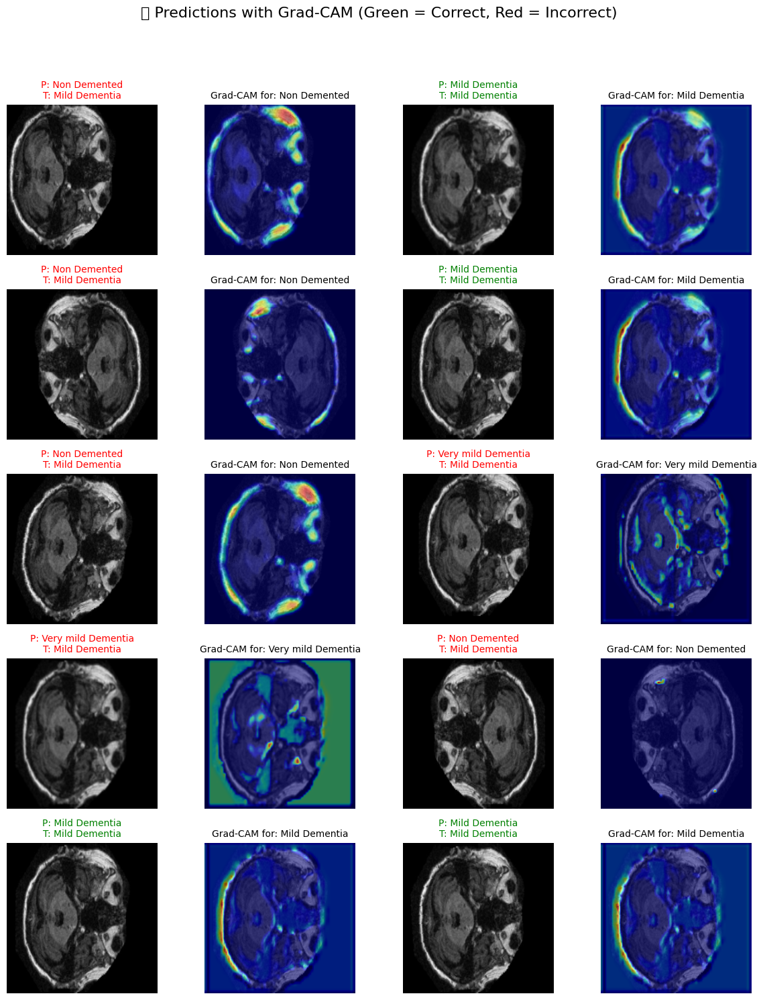

In [7]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# --- (Your SimpleCNN class definition - NO CHANGE) ---
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=4):
        super(SimpleCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.adaptive_pool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.adaptive_pool(x)
        x = self.classifier(x)
        return x

# --- (Your load_model function - NO CHANGE) ---
def load_model(model_path, num_classes=4):
    model = SimpleCNN(num_classes)
    if torch.cuda.is_available():
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs with DataParallel!")
            model = nn.DataParallel(model)
        model = model.to('cuda')
    checkpoint = torch.load(model_path, map_location='cuda' if torch.cuda.is_available() else 'cpu')
    model.load_state_dict(checkpoint)
    model.eval()
    return model

model_path = '/kaggle/input/alzhiemers_cnn/pytorch/default/1/alzheimers_model_corrected (1).pth'
model = load_model(model_path)

# --- (Your Dataset Loader setup - NO CHANGE) ---
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

data_path = '/kaggle/working/TransformedOASIS'
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# Make sure dataset is defined if not already in your full script.
# If dataset is not defined:
try:
    dataset
except NameError:
    dataset = datasets.ImageFolder(root=data_path, transform=transform)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

class_names = dataset.classes

# ----------------------------
# GRAD-CAM IMPLEMENTATION (CRITICAL FIX HERE)
# ----------------------------

class GradCAM:
    def __init__(self, model, target_layer_name):
        # Access the underlying module if the model is wrapped in DataParallel
        self.model = model.module if isinstance(model, nn.DataParallel) else model
        self.target_layer_name = target_layer_name
        self.gradients = None
        self.activations = None

        self.hook_fns = []
        # Register hooks on the actual sub-module
        for name, module in self.model.named_modules():
            if name == self.target_layer_name:
                self.hook_fns.append(module.register_forward_hook(self._save_activations_hook))
                # grad_output[0] is the gradient w.r.t. the output of the module
                self.hook_fns.append(module.register_backward_hook(self._save_gradients_hook))
                break # Found the layer, no need to iterate further

    def _save_activations_hook(self, module, input, output):
        self.activations = output

    def _save_gradients_hook(self, module, grad_input, grad_output):
        # grad_output is a tuple. The first element is the gradient w.r.t. the output.
        self.gradients = grad_output[0]

    def __call__(self, input_tensor, target_class=None):
        self.model.zero_grad() # Clear previous gradients for the *underlying* model

        # Ensure the model is in evaluation mode for forward pass consistency
        # and has its gradients enabled for the specific call needed by grad-cam.
        # This part is handled outside in the main loop now, which is better.

        # Forward pass
        output = self.model(input_tensor) # Use the underlying model for forward pass

        if target_class is None:
            target_class = torch.argmax(output).item()

        # Backward pass
        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][target_class] = 1
        
        # Ensure 'output' has its grad_fn (which it should if called outside no_grad)
        output.backward(gradient=one_hot_output, retain_graph=True)

        # Get gradients and activations
        # Add a check: If self.gradients is still None, it indicates a problem with the hook or graph
        if self.gradients is None:
            raise RuntimeError(f"Gradients for target layer '{self.target_layer_name}' were not captured. "
                               "Ensure `images.requires_grad_(True)` is set before model forward pass and "
                               "the model call is outside `torch.no_grad()`.")

        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]

        weights = np.mean(gradients, axis=(1, 2))

        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)

        cam = torch.from_numpy(cam).unsqueeze(0).unsqueeze(0)
        cam = F.interpolate(cam, size=input_tensor.shape[2:], mode='bilinear', align_corners=False)
        cam = cam.squeeze().numpy()

        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

        return cam

    def remove_hooks(self):
        for h in self.hook_fns:
            h.remove()

# Instantiate Grad-CAM (updated to reflect DataParallel handling)
# The model passed here is the 'model' object returned by load_model, which might be DataParallel
grad_cam = GradCAM(model, target_layer_name='features.6')

# ----------------------------
# 4. Run Predictions and Generate Grad-CAMs (NO CHANGE FROM PREVIOUS FIX)
# ----------------------------
correct = 0
total = 0
all_preds = []
all_labels = []
all_imgs_for_display = []
all_heatmaps = []

model.eval()

for images, labels in dataloader:
    if torch.cuda.is_available():
        images = images.cuda()
        labels = labels.cuda()

    images.requires_grad_(True)
    
    outputs = model(images) # Moved outside of torch.no_grad()

    predicted_class_idx = torch.argmax(outputs).item() 
    heatmap = grad_cam(images, target_class=predicted_class_idx)
    all_heatmaps.append(heatmap)

    images.requires_grad_(False)

    with torch.no_grad():
        _, preds = torch.max(outputs.detach(), 1)

    correct += (preds == labels).sum().item()
    total += labels.size(0)

    all_preds.extend(preds.cpu().numpy())
    all_labels.extend(labels.cpu().numpy())

    img_display = (images.cpu().detach() * 0.5) + 0.5 
    all_imgs_for_display.extend(img_display)

grad_cam.remove_hooks()

accuracy = 100 * correct / total
print(f"✅ Accuracy on transformed dataset: {accuracy:.2f}%")

# ----------------------------
# 5. Visualize Predictions with Grad-CAM (NO CHANGE)
# ----------------------------
def show_predictions_with_gradcam(images, labels, preds, heatmaps, class_names, num_samples_to_show=10, cols=2):
    num_samples_to_show = min(num_samples_to_show, len(images))

    rows = (num_samples_to_show + cols - 1) // cols
    plt.figure(figsize=(cols * 6, rows * 3))

    for i in range(num_samples_to_show):
        img_np = images[i].squeeze().numpy()

        label = class_names[labels[i]]
        pred = class_names[preds[i]]
        correct = label == pred
        
        heatmap = heatmaps[i]

        ax1 = plt.subplot(rows, cols * 2, (i * 2) + 1)
        ax1.imshow(img_np, cmap='gray', vmin=0, vmax=1)
        ax1.set_title(f"P: {pred}\nT: {label}", color='green' if correct else 'red', fontsize=10)
        ax1.axis('off')

        ax2 = plt.subplot(rows, cols * 2, (i * 2) + 2)
        ax2.imshow(img_np, cmap='gray', vmin=0, vmax=1)
        ax2.imshow(heatmap, cmap='jet', alpha=0.5)
        ax2.set_title(f"Grad-CAM for: {pred}", fontsize=10)
        ax2.axis('off')
        
    plt.suptitle("✅ Predictions with Grad-CAM (Green = Correct, Red = Incorrect)", fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()

show_predictions_with_gradcam(all_imgs_for_display, all_labels, all_preds, all_heatmaps, class_names, num_samples_to_show=10)